In [1]:
import os
import re
import requests
from PIL import Image
import pandas as pd
import numpy as np

#libraries for data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# import Deep learning Libraries
#preprocessing, modeling & Evaluation
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras import regularizers
import warnings
warnings.filterwarnings('ignore')

In [2]:
data_dir= 'Original'
filepaths=[]
labels=[]


folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        # Select just tumor name
        fold = str(fold).replace('C+', '')
        labels.append(fold[:-3])

        
# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

In [3]:
df

,filepaths,labels
0,Original\Benign\WBC-Benign-001.jpg,Ben
1,Original\Benign\WBC-Benign-002.jpg,Ben
2,Original\Benign\WBC-Benign-003.jpg,Ben
3,Original\Benign\WBC-Benign-004.jpg,Ben
4,Original\Benign\WBC-Benign-005.jpg,Ben
...,...,...
3251,Original\Pro\WBC-Malignant-Pro-800.jpg,
3252,Original\Pro\WBC-Malignant-Pro-801.jpg,
3253,Original\Pro\WBC-Malignant-Pro-802.jpg,
3254,Original\Pro\WBC-Malignant-Pro-803.jpg,


In [4]:
# train dataframe
train_df, dummy_df = train_test_split(df,  train_size= 0.8, shuffle= True, random_state= 123)

# valid and test dataframe
valid_df, test_df = train_test_split(dummy_df,  train_size= 0.6, shuffle= True, random_state= 123)

In [5]:
# crobed image size
batch_size = 16
img_size = (300, 300)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()
train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 2604 validated image filenames belonging to 3 classes.
Found 391 validated image filenames belonging to 3 classes.
Found 261 validated image filenames belonging to 3 classes.


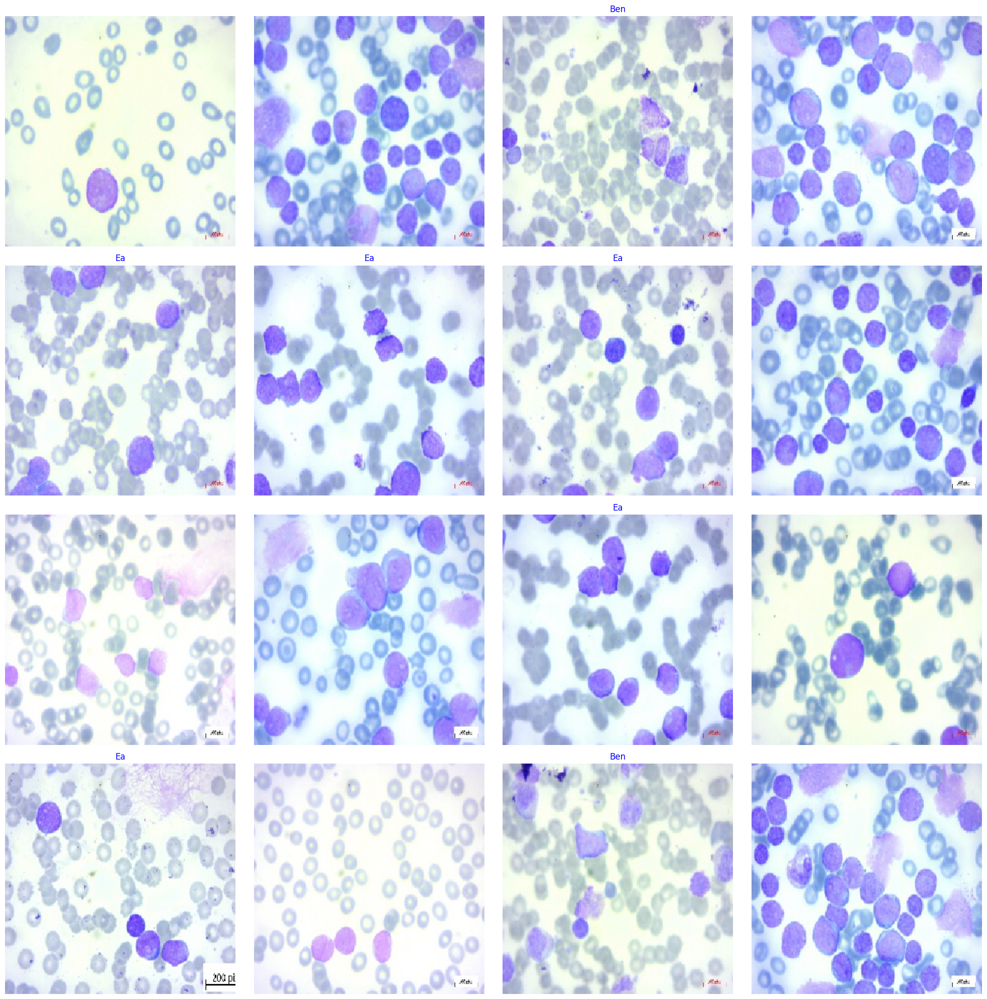

In [6]:
#Samples Of The Data
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator
# # difference between next iterator and for iterator


plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [7]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adamax

img_size = (300, 300)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

class_count = len(list(train_gen.class_indices.keys()))  # Number of classes

# Define the base model
base_model = tf.keras.applications.EfficientNetB7(include_top=False, weights='imagenet', input_shape=img_shape, pooling='avg')

# Freeze the base model layers
base_model.trainable = False

# Define the input layer
inputs = Input(shape=img_shape)

# Pass input through base model
x = base_model(inputs, training=False)

# Add additional layers
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(rate=0.3)(x)
outputs = Dense(class_count, activation='softmax')(x)

# Define the model
model = Model(inputs, outputs)

# Compile the model
model.compile(optimizer=Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 300, 300, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb7 (Functional)          │ (None, 2560)                │      64,097,687 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2560)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         655,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │             771 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 64,754,074 (247.02 MB)

 Trainable params: 656,387 (2.50 MB)

 Non-trainable params: 64,097,687 (244.51 MB)

In [8]:

epochs = 10  # number of all epochs in training

history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1966s 11s/step - accuracy: 0.7672 - loss: 0.5944 - val_accuracy: 0.9412 - val_loss: 0.1795
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1728s 11s/step - accuracy: 0.9367 - loss: 0.2124 - val_accuracy: 0.9847 - val_loss: 0.0964
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1557s 10s/step - accuracy: 0.9619 - loss: 0.1517 - val_accuracy: 0.9821 - val_loss: 0.0742
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1397s 9s/step - accuracy: 0.9634 - loss: 0.1320 - val_accuracy: 0.9898 - val_loss: 0.0643
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1391s 9s/step - accuracy: 0.9652 - loss: 0.1099 - val_accuracy: 0.9847 - val_loss: 0.0485
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1645s 10s/step - accuracy: 0.9698 - loss: 0.1007 - val_accuracy: 0.9872 - val_loss: 0.0472
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1748s 11s/step - accuracy: 0.9715 - loss: 0.0939 - val_accuracy: 0.9898 - val_loss: 0.0418
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1736s 11s/step - accuracy: 0.9728 - loss: 0.0

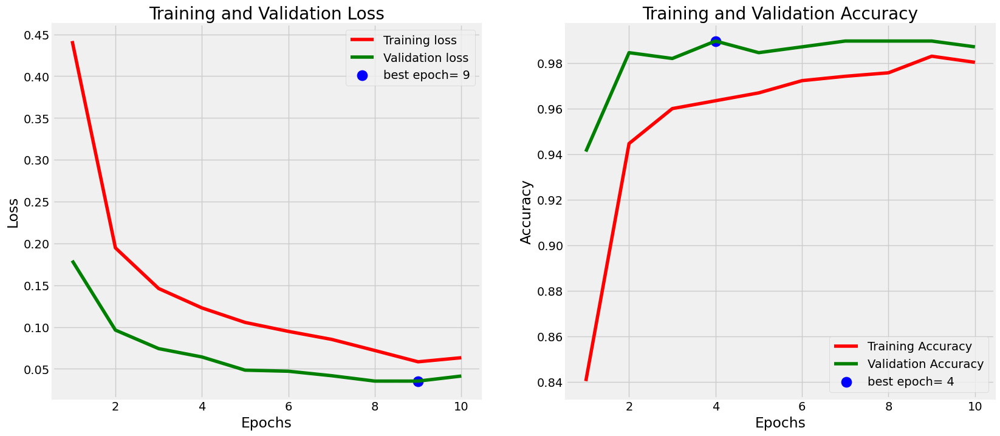

In [9]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]

Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

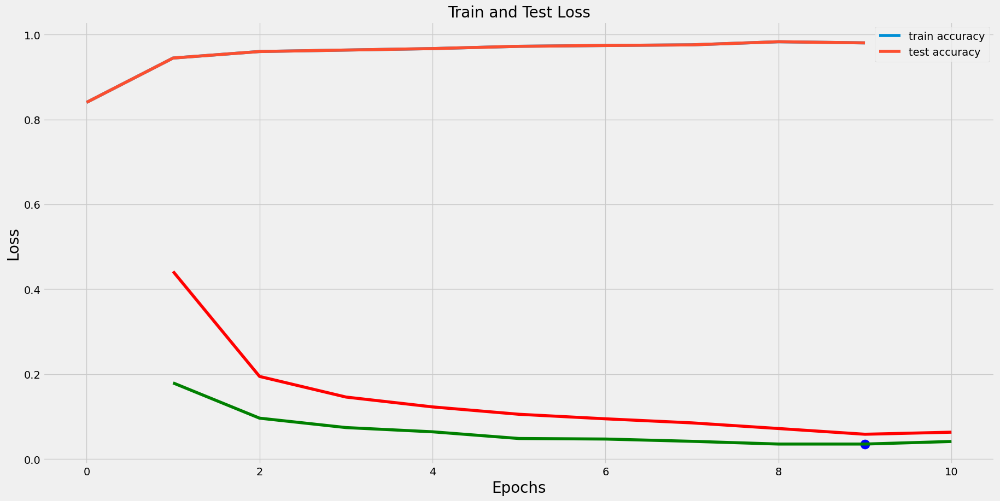

In [10]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc =  history.history['accuracy']
val_acc =  history.history['accuracy']
xc = range(len(tr_acc))

plt.figure(figsize=(20,10))
plt.plot(xc,train_acc,label='train accuracy')
plt.plot(xc,val_acc,label='test accuracy')
plt.legend()
plt.title('Train and Test Loss',size=20)
plt.xlabel('Epochs',size=20)
plt.ylabel('Loss',size=20)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.tight_layout
plt.show()

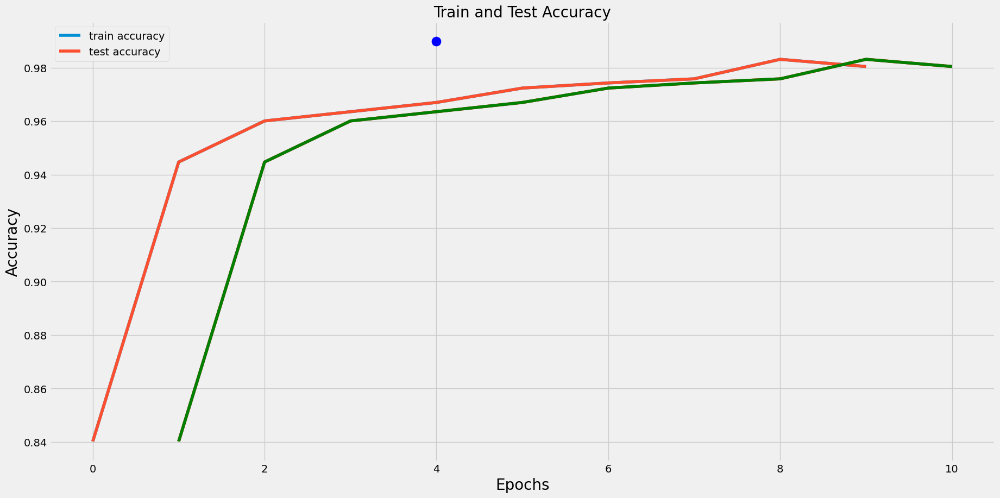

In [11]:
plt.figure(figsize=(20,10))
plt.plot(xc,train_acc,label='train accuracy')
plt.plot(xc,val_acc,label='test accuracy')
plt.legend()
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Train and Test Accuracy',size=20)
plt.xlabel('Epochs',size=20)
plt.ylabel('Accuracy',size=20)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy') 


plt.tight_layout
plt.show()

In [12]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

9/9 ━━━━━━━━━━━━━━━━━━━━ 116s 13s/step - accuracy: 1.0000 - loss: 0.0130
9/9 ━━━━━━━━━━━━━━━━━━━━ 105s 12s/step - accuracy: 0.9890 - loss: 0.0419
9/9 ━━━━━━━━━━━━━━━━━━━━ 102s 11s/step - accuracy: 0.9942 - loss: 0.0274
Train Loss:  0.015672747045755386
Train Accuracy:  1.0
--------------------
Validation Loss:  0.047023285180330276
Validation Accuracy:  0.9861111044883728
--------------------
Test Loss:  0.046169623732566833
Test Accuracy:  0.9791666865348816


In [13]:
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)

17/17 ━━━━━━━━━━━━━━━━━━━━ 198s 10s/step


In [14]:
# Classification report
print(classification_report(test_gen.classes, y_pred, target_names= classes))

              precision    recall  f1-score   support

                   0.99      0.99      0.99       135
         Ben       0.92      0.97      0.95        36
          Ea       0.99      0.97      0.98        90

    accuracy                           0.98       261
   macro avg       0.97      0.98      0.97       261
weighted avg       0.98      0.98      0.98       261



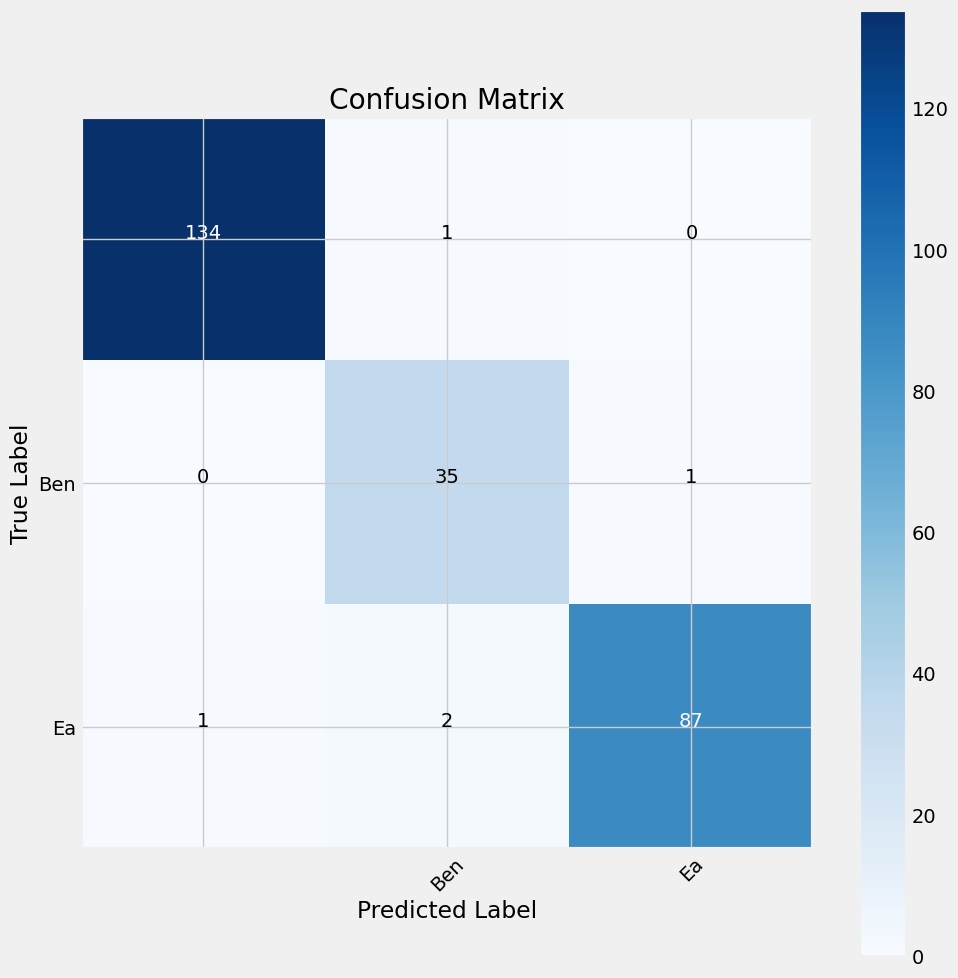

In [15]:
import itertools
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

Found 3256 images belonging to 4 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


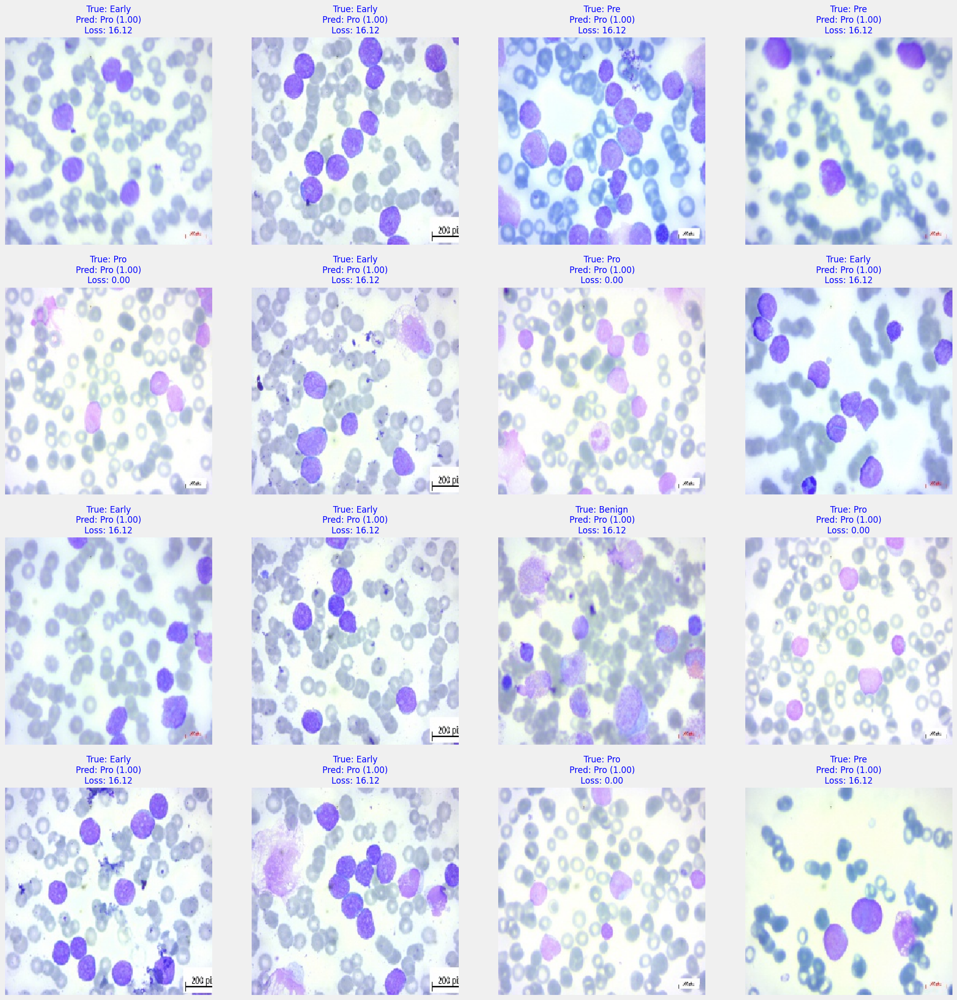

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.losses import CategoricalCrossentropy

# Step 1: Define and Compile the Model
model = Sequential([
    # Example model structure, adjust as necessary
    Flatten(input_shape=(300, 300, 3)),  # Flatten input images of size 300x300 with 3 channels (RGB)
    Dense(128, activation='relu'),       # First hidden layer with 128 units
    Dense(4, activation='softmax')       # Output layer for 4 classes (adjust this if you have a different number of classes)
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Step 2: Load the Dataset
train_gen = ImageDataGenerator().flow_from_directory(
    'Original',            # Replace with your dataset directory
    target_size=(300, 300), # Rescale images to 300x300
    batch_size=32,          # Batch size of 32
    class_mode='categorical' # Use 'categorical' mode for multi-class classification
)

# Get class indices and class names
g_dict = train_gen.class_indices
classes = list(g_dict.keys())  # List of class names

# Step 3: Get a Batch of Images and Labels
images, labels = next(train_gen)

# Step 4: Get Model Predictions
predictions = model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)  # Get the predicted class indices

# Step 5: Define the Loss Function
loss_function = CategoricalCrossentropy()

# Step 6: Calculate Loss for Each Sample in the Batch
losses = []
for i in range(len(images)):
    # Calculate loss for each image individually
    loss = loss_function(labels[i:i+1], predictions[i:i+1]).numpy()
    losses.append(loss)

# Step 7: Plot the Images with Actual Labels, Predictions, and Loss Probabilities
plt.figure(figsize=(20, 20))

# Plot up to 16 images
num_images = min(len(images), 16)
for i in range(num_images):
    plt.subplot(4, 4, i + 1)  # Create a grid of 4x4 images
    
    # Normalize image for displaying
    image = images[i] / 255.0
    plt.imshow(image)
    
    # Get the true class and predicted class
    true_class_index = np.argmax(labels[i])
    predicted_class_index = predicted_classes[i]
    
    # Get the class names for the true and predicted classes
    true_class_name = classes[true_class_index]
    predicted_class_name = classes[predicted_class_index]
    
    # Get the probability of the predicted class
    predicted_prob = np.max(predictions[i])
    
    # Get the loss for this particular image
    loss_prob = losses[i]
    
    # Create a title with true label, predicted label, confidence, and loss
    title = (f"True: {true_class_name}\n"
             f"Pred: {predicted_class_name} ({predicted_prob:.2f})\n"
             f"Loss: {loss_prob:.2f}")
    
    # Set the title and remove the axis for a clean display
    plt.title(title, color='blue', fontsize=12)
    plt.axis('off')

# Adjust the layout to fit the plots nicely
plt.tight_layout()
plt.show()


Image 1:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 2:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 3:
True Class: Pre
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 4:
True Class: Pre
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 5:
True Class: Pro
Predicted Class: Pro (Confidence: 1.00)
Loss: 0.00

Image 6:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 7:
True Class: Pro
Predicted Class: Pro (Confidence: 1.00)
Loss: 0.00

Image 8:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 9:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 10:
True Class: Early
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 11:
True Class: Benign
Predicted Class: Pro (Confidence: 1.00)
Loss: 16.12

Image 12:
True Class: Pro
Predicted Class: Pro (Confidence: 1.00)
Loss: 0.00

Image 13:
True Class: Early
Predicted Class: Pro 

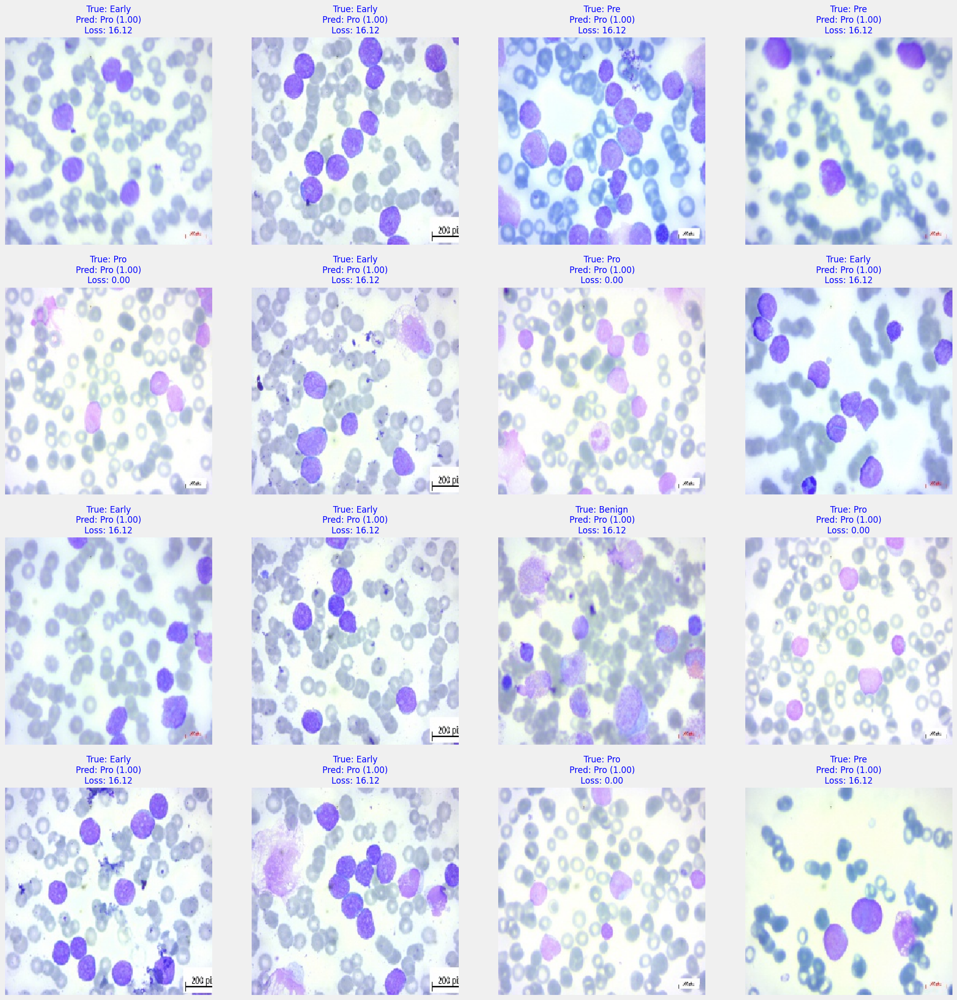

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Plot images and print predicted output
plt.figure(figsize=(20, 20))

# Define how many images to plot (in this case, we'll plot up to 16 images)
num_images = min(len(images), 16)

for i in range(num_images):
    plt.subplot(4, 4, i + 1)
    
    # Normalize image for displaying
    image = images[i] / 255
    plt.imshow(image)
    
    # Get true class, predicted class, and probabilities
    true_class_index = np.argmax(labels[i])
    predicted_class_index = predicted_classes[i]
    
    true_class_name = classes[true_class_index]
    predicted_class_name = classes[predicted_class_index]
    
    predicted_prob = np.max(predictions[i])
    loss_prob = losses[i]
    
    # Display prediction info on the plot
    title = (f"True: {true_class_name}\n"
             f"Pred: {predicted_class_name} ({predicted_prob:.2f})\n"
             f"Loss: {loss_prob:.2f}")
    
    plt.title(title, color='blue', fontsize=12)
    plt.axis('off')
    
    # Print prediction details in the console
    print(f"Image {i+1}:")
    print(f"True Class: {true_class_name}")
    print(f"Predicted Class: {predicted_class_name} (Confidence: {predicted_prob:.2f})")
    print(f"Loss: {loss_prob:.2f}\n")

# Adjust layout for better visual display of images
plt.tight_layout()
plt.show()


Image 1:
Predicted Class: Pro (Confidence: 1.00)

Image 2:
Predicted Class: Pro (Confidence: 1.00)

Image 3:
Predicted Class: Pro (Confidence: 1.00)

Image 4:
Predicted Class: Pro (Confidence: 1.00)

Image 5:
Predicted Class: Pro (Confidence: 1.00)

Image 6:
Predicted Class: Pro (Confidence: 1.00)

Image 7:
Predicted Class: Pro (Confidence: 1.00)

Image 8:
Predicted Class: Pro (Confidence: 1.00)

Image 9:
Predicted Class: Pro (Confidence: 1.00)

Image 10:
Predicted Class: Pro (Confidence: 1.00)

Image 11:
Predicted Class: Pro (Confidence: 1.00)

Image 12:
Predicted Class: Pro (Confidence: 1.00)

Image 13:
Predicted Class: Pro (Confidence: 1.00)

Image 14:
Predicted Class: Pro (Confidence: 1.00)

Image 15:
Predicted Class: Pro (Confidence: 1.00)

Image 16:
Predicted Class: Pro (Confidence: 1.00)



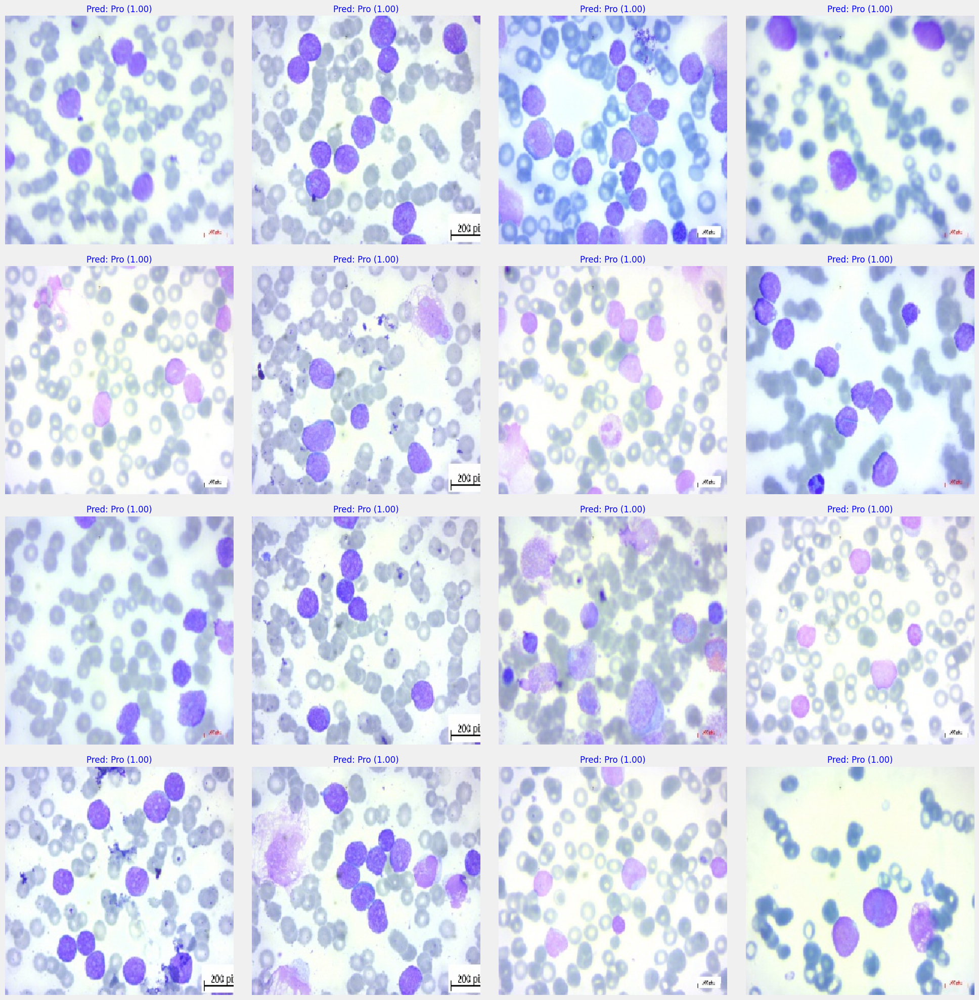

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Plot images and print predicted output
plt.figure(figsize=(20, 20))

# Define how many images to plot (in this case, we'll plot up to 16 images)
num_images = min(len(images), 16)

for i in range(num_images):
    plt.subplot(4, 4, i + 1)
    
    # Normalize image for displaying
    image = images[i] / 255
    plt.imshow(image)
    
    # Get predicted class and probabilities
    predicted_class_index = predicted_classes[i]
    predicted_class_name = classes[predicted_class_index]
    predicted_prob = np.max(predictions[i])
    
    # Display prediction info on the plot
    title = (f"Pred: {predicted_class_name} ({predicted_prob:.2f})")
    
    plt.title(title, color='blue', fontsize=12)
    plt.axis('off')
    
    # Print only the predicted class and probability
    print(f"Image {i+1}:")
    print(f"Predicted Class: {predicted_class_name} (Confidence: {predicted_prob:.2f})\n")

# Adjust layout for better visual display of images
plt.tight_layout()
plt.show()


In [23]:
model.save('my_model.keras')

# Load the model
loaded_model = keras.models.load_model('my_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
Prediction: class4 with confidence 0.81


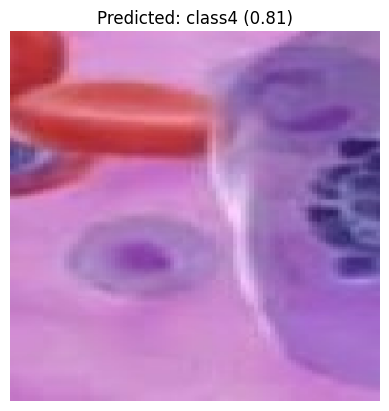

In [24]:
import numpy as np
from tensorflow import keras
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the saved model
loaded_model = keras.models.load_model('my_model.keras')

# Function to preprocess the image and make predictions
def predict_image(image_path, model):
    # Step 1: Load the image
    img = image.load_img(image_path, target_size=(300, 300))  # Use the target size your model expects (300x300 here)
    
    # Step 2: Convert the image to an array
    img_array = image.img_to_array(img)
    
    # Step 3: Expand dimensions to match the expected input shape (1, 300, 300, 3)
    img_array = np.expand_dims(img_array, axis=0)
    
    # Step 4: Normalize the image (if the model was trained on normalized images)
    img_array /= 255.0  # Normalize pixel values to [0, 1]

    # Step 5: Make predictions
    predictions = model.predict(img_array)
    
    # Step 6: Get the predicted class (if it's categorical)
    predicted_class_index = np.argmax(predictions, axis=1)[0]  # Assuming it's a multi-class classification
    predicted_class_prob = np.max(predictions)  # Get the confidence of the prediction
    
    return predicted_class_index, predicted_class_prob

# Path to the image you want to predict
image_path = r"C:\Users\suhan\Downloads\pre3.jpeg"

# Make the prediction
predicted_class_index, predicted_class_prob = predict_image(image_path, loaded_model)

# Print the prediction result
classes = ['class1', 'class2', 'class3', 'class4']  # Replace with your actual class labels
predicted_class_name = classes[predicted_class_index]
print(f"Prediction: {predicted_class_name} with confidence {predicted_class_prob:.2f}")

# Optional: Display the image along with the prediction
img = image.load_img(image_path, target_size=(300, 300))
plt.imshow(img)
plt.title(f"Predicted: {predicted_class_name} ({predicted_class_prob:.2f})")
plt.axis('off')
plt.show()
